# Import


In [1]:
!pip3 install --upgrade tensorflow

In [2]:
from matplotlib.image import imread
import matplotlib.pyplot as plt
%matplotlib inline
import os
import numpy as np
import zipfile
import random
import cv2
import math
from tensorflow import keras
import tensorflow as tf
import keras.backend as kb
from tensorflow.keras.layers import  Input,Conv2D,Conv2DTranspose,Concatenate,BatchNormalization,LeakyReLU,ReLU,Activation,Dropout,GaussianDropout
from tensorflow.keras.models import Model,Sequential,load_model,save_model
from tensorflow.keras.optimizers import Adam,RMSprop
from tensorflow.keras.utils import plot_model
from tensorflow.keras.activations import sigmoid,tanh,relu,elu
from tensorflow.keras.initializers import TruncatedNormal,RandomNormal
from tensorflow.keras.losses import BinaryCrossentropy,MAE,binary_crossentropy,MeanAbsoluteError
from tensorflow.keras.applications.vgg19 import VGG19
from time import perf_counter
from scipy.ndimage.filters import gaussian_filter1d
print(tf.__version__)

2023-12-27 11:26:34.677476: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-27 11:26:34.861472: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-27 11:26:34.861595: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-27 11:26:34.898377: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-27 11:26:34.969802: I tensorflow/core/platform/cpu_feature_guar

2.15.0


/tmp/ipykernel_951197/2039821898.py:22: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


In [3]:
import tensorflow as tf
import tensorrt
# Check TensorFlow version
print(f"TensorFlow version: {tf.__version__}")

# Check GPU availability
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)
else:
    print("No GPUs detected.")

# Run a simple TensorFlow operation

TensorFlow version: 2.15.0
1 Physical GPUs, 1 Logical GPUs


2023-12-27 11:26:37.102032: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-27 11:26:37.134493: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-27 11:26:37.134680: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# Loading and Preprocessing dataset


In [4]:
m_train = len(os.listdir(r"/home/ahaanbanerjee/PJT/blur_dataset_scaled/train/sharp"))
m_test = len(os.listdir(r"/home/ahaanbanerjee/PJT/blur_dataset_scaled/test/sharp"))
print("No. of Images In Training Set : "+str(m_train))
print("No. of Images In Testing Set : "+str(m_test))

No. of Images In Training Set : 271
No. of Images In Testing Set : 79


In [5]:
m_train = 270#m_train-1
s = m_train/271
s

0.996309963099631

In [6]:
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=s)

In [7]:
d_seed = 1
mini_batch_size = 2
blurry    = image_generator.flow_from_directory(r"/home/ahaanbanerjee/PJT/blur_dataset_scaled/train/",target_size=[256,256],batch_size = mini_batch_size,shuffle = True,classes=["defocused_blurred"],class_mode=None,seed=d_seed,subset='validation')
benchmark = image_generator.flow_from_directory(r"/home/ahaanbanerjee/PJT/blur_dataset_scaled/train/",target_size=[256,256],batch_size = mini_batch_size,shuffle = True,classes=["sharp"],class_mode=None,seed=d_seed,subset='validation')
image_data = zip(blurry,benchmark)

Found 270 images belonging to 1 classes.
Found 270 images belonging to 1 classes.


In [8]:
m_test = m_test-1
st = m_test/79
st

0.9873417721518988

In [9]:
image_generator_test = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=st)

In [10]:
d_seed = 1
mini_batch_size_test = 2
blurry    = image_generator_test.flow_from_directory(r"/home/ahaanbanerjee/PJT/blur_dataset_scaled/test/",target_size=[256,256],batch_size = mini_batch_size_test,shuffle = True,classes=["defocused_blurred"],class_mode=None,seed=d_seed,subset='validation')
benchmark = image_generator_test.flow_from_directory(r"/home/ahaanbanerjee/PJT/blur_dataset_scaled/test/",target_size=[256,256],batch_size = mini_batch_size_test,shuffle = True,classes=["sharp"],class_mode=None,seed=d_seed,subset='validation')
image_data_test = zip(blurry,benchmark)

Found 78 images belonging to 1 classes.
Found 78 images belonging to 1 classes.


# Dataset Sample

In [11]:
for batch in image_data:
    batch = list(batch)
    print("Image batch shape: ", batch[0].shape)
    break
batch[0] = (batch[0]-127.5)/127.5
batch[1] = (batch[1]-127.5)/127.5
batch[0][np.where(batch[0] > 1)]= 1
batch[0][np.where(batch[0] < -1)]=-1
batch[1][np.where(batch[1] > 1)]= 1
batch[1][np.where(batch[1] < -1)]=-1
print("Blurry Batch Statistical Analysis")
print("Standard Deviation = "+str(batch[0].std()))
print("Variance = "+str(batch[0].var()))
print("Mean = "+str(batch[0].mean()))
print("Max = "+str(batch[0].max()))
print("Min = "+str(batch[0].min()))
print("Shape = "+str(batch[0].shape))
print("================================")
print("Sharp Batch Statistical Analysis")
print("Standard Deviation = "+str(batch[1].std()))
print("Variance = "+str(batch[1].var()))
print("Mean = "+str(batch[1].mean()))
print("Max = "+str(batch[1].max()))
print("Min = "+str(batch[1].min()))
print("Shape = "+str(batch[1].shape))

Image batch shape:  (2, 256, 256, 3)
Blurry Batch Statistical Analysis
Standard Deviation = 0.5693364
Variance = 0.32414395
Mean = -0.074861504
Max = 1.0
Min = -1.0
Shape = (2, 256, 256, 3)
Sharp Batch Statistical Analysis
Standard Deviation = 0.5320024
Variance = 0.28302655
Mean = -0.20126049
Max = 1.0
Min = -1.0
Shape = (2, 256, 256, 3)


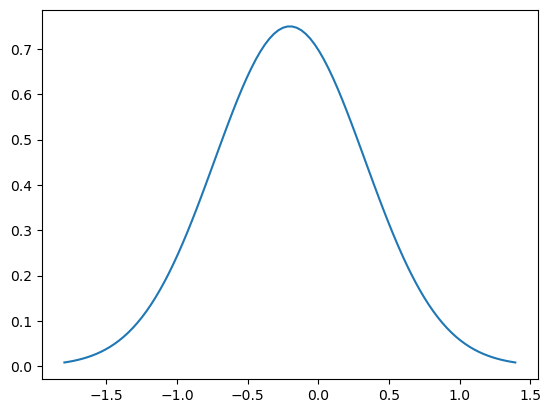

In [12]:
import scipy.stats as stats
x = np.linspace(batch[1].mean() - 3*batch[1].std(), batch[1].mean() + 3*batch[1].std(), 100)
plt.plot(x, stats.norm.pdf(x, batch[1].mean(), batch[1].std()))
plt.show()

In [13]:
batch[0] = (batch[0]+1)/2.0
batch[1] = (batch[1]+1)/2.0

1


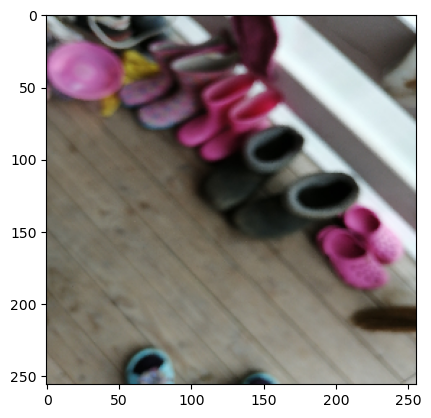

In [14]:
a = random.randint(0,batch[0].shape[0]-1)
print(a)
plt.imshow(batch[0][a])
plt.show()

In [15]:
ppp = batch[0][a]

In [16]:
ppp.shape
ppp = ppp.reshape(1,256,256,3)

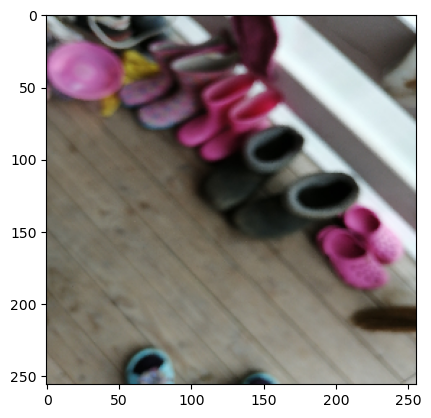

In [17]:
plt.imshow(ppp[0])
ppp[0] = (ppp[0]-0.5)/0.5
ppp[0][np.where(ppp[0] > 1)]= 1
ppp[0][np.where(ppp[0] < -1)]=-1

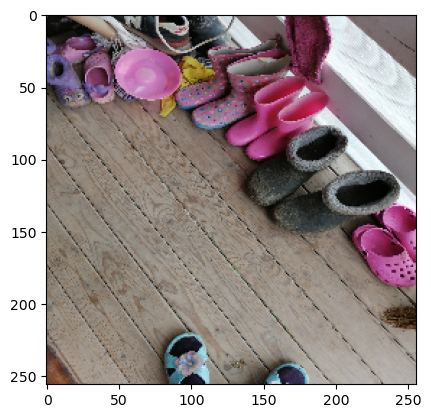

In [18]:
plt.imshow(batch[1][a])
plt.show()

# Hyper-Parameters and helper functions

In [19]:
learning_rate = 0.0001

In [20]:
def convert(seconds):
    seconds = seconds % (24 * 3600)
    hour = seconds // 3600
    seconds %= 3600
    minutes = seconds // 60
    seconds %= 60

    return "Approx Time Required = %d:%02d:%02d" % (hour, minutes, seconds)

# Discriminator

In [21]:
def discriminator():
    inpt = Input(shape=(256,256,3))
    k_init = TruncatedNormal(mean=0.0,stddev=0.02,seed=1)
    #k_init = RandomNormal(stddev=0.02)

    #X(m,256,256,3)
    L1 = Conv2D(filters=64,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(inpt)
    #L1 = BatchNormalization()(L1)
    L1 = LeakyReLU(alpha = 0.2)(L1)
    #(m,128,128,64)
    L2 = Conv2D(filters=128,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L1)
    L2 = BatchNormalization()(L2)
    L2 = LeakyReLU(alpha = 0.2)(L2)
    #(m,64,64,128)
    L3 = Conv2D(filters=256,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L2)
    L3 = BatchNormalization()(L3)
    L3 = LeakyReLU(alpha = 0.2)(L3)
    #(m,32,32,256)
    L4 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L3)
    L4 = BatchNormalization()(L4)
    L4 = LeakyReLU(alpha = 0.2)(L4)
    #(m,16,16,512)
    L5 = Conv2D(filters=512,kernel_size=3,strides=(1,1),padding='same', kernel_initializer=k_init)(L4)
    L5 = BatchNormalization()(L5)
    L5 = LeakyReLU(alpha = 0.2)(L5)
    #(m,16,16,512)
    L6 = Conv2D(filters=1,kernel_size=1,strides=(1,1),padding='same', kernel_initializer=k_init,activation=sigmoid)(L5)
    L6W = Conv2D(filters=1,kernel_size=1,strides=(1,1),padding='same', kernel_initializer=k_init,activation=relu)(L5)
    #(m,16,16,1)

    discriminator = Model(inputs=inpt, outputs=[L6,L6W])

    return discriminator

In [22]:
d = discriminator()
#d.summary()
#plot_model(d, to_file='Dis.png', show_shapes=True, show_layer_names=True,dpi=50)

# Translator


In [23]:
class PixelShuffleLayer(tf.keras.layers.Layer):
    def __init__(self, upscale_factor, **kwargs):
        super(PixelShuffleLayer, self).__init__(**kwargs)
        self.upscale_factor = upscale_factor

    def call(self, inputs):
        return tf.nn.depth_to_space(inputs, self.upscale_factor)

    def compute_output_shape(self, input_shape):
        height = input_shape[1] * self.upscale_factor
        width = input_shape[2] * self.upscale_factor
        channels = input_shape[3] // (self.upscale_factor ** 2)
        return (input_shape[0], height, width, channels)
class WaveletTransformLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(WaveletTransformLayer, self).__init__(**kwargs)

    def build(self, input_shape):
          # Initialize the wavelet filter bank coefficients here
        haar_filter = np.array([[1, 1], [1, -1]], dtype=np.float32).reshape(2, 2, 1, 1)
        # Repeat the haar_filter to match the input_shape[-1] and output_channels
        # The new shape should be (2, 2, input_shape[-1], 4)
        self.kernel = self.add_weight(
            name='kernel',
            shape=[2, 2, input_shape[-1], 4],
            initializer=tf.keras.initializers.Constant(
                np.tile(haar_filter, (1, 1, input_shape[-1], 4))
            ),
            trainable=False
        )

    def call(self, input):
        # Perform the wavelet transform (using depthwise_conv2d for demonstration)
        transformed = tf.nn.depthwise_conv2d(input, self.kernel, strides=[1, 2, 2, 1], padding='SAME')
        return transformed

    def compute_output_shape(self, input_shape):
        height, width = input_shape[1]//2, input_shape[2]//2
        return (input_shape[0], height, width, input_shape[3]*4)

In [24]:
# Custom layer for Wavelet Transform


def translator_with_wavelet():
    inpt = Input(shape=(256,256,3))
    k_init = TruncatedNormal(mean=0.0,stddev=0.02,seed=1)
    L1 = Conv2D(filters=64,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(inpt)
    L1 = LeakyReLU(alpha = 0.2)(L1)

    # Apply Wavelet Transform
    L1_wavelet = WaveletTransformLayer()(L1)

    L2 = Conv2D(filters=128,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L1_wavelet)
    L2 = BatchNormalization()(L2)
    L2 = LeakyReLU(alpha = 0.2)(L2)

    L3 = Conv2D(filters=256,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L2)
    L3 = BatchNormalization()(L3)
    L3 = LeakyReLU(alpha = 0.2)(L3)
    #(m,32,32,256)

    L4 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L3)
    L4 = BatchNormalization()(L4)
    L4 = LeakyReLU(alpha = 0.2)(L4)
    #(m,16,16,512)

    L5 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L4)
    L5 = BatchNormalization()(L5)
    L5 = LeakyReLU(alpha = 0.2)(L5)
    #(m,8,8,512)

    L6 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L5)
    L6 = BatchNormalization()(L6)
    L6 = LeakyReLU(alpha = 0.2)(L6)
    #(m,4,4,512)

    # L7 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L6)
    # L7 = BatchNormalization()(L7)
    # L7 = LeakyReLU(alpha = 0.2)(L7)
    # #(m,2,2,512)
    # L7_upsampled = Conv2DTranspose(filters=512, kernel_size=3, strides=(2, 2), padding='same', kernel_initializer=k_init)(L7)
    # L7_upsampled = BatchNormalization()(L7_upsampled)
    # L7_upsampled = LeakyReLU(alpha=0.2)(L7_upsampled)

    L8 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L6)
    L8 = BatchNormalization()(L8)
    L8 = LeakyReLU(alpha = 0.2)(L8)
    #(m,1,1,512)
        
    # D1 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(L8)
    # D1 = BatchNormalization()(D1)
    # #D1 = Dropout(0.5)(D1, training=True)
    # D1 = tf.keras.backend.dropout(D1,0.5)
    L8_upscale_prep = Conv2D(filters=2048, kernel_size=1, strides=(1, 1), padding='same', kernel_initializer=k_init)(L8)

# Step 2: Apply Pixel Shuffling to increase spatial dimensions
    D1 = PixelShuffleLayer(upscale_factor=2)(L8_upscale_prep)
    D1 = BatchNormalization()(D1)
    #D1 = PixelShuffleLayer(upscale_factor=2)(D1) 
    D1 = relu(D1)
    print(D1.shape)
    D1 = Concatenate()([D1,L6])

    #(m,2,2,1024)
    
    D2 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D1)
    D2 = BatchNormalization()(D2)
    #D2 = Dropout(0.5)(D2, training=True)
    D2 = tf.keras.backend.dropout(D2,0.5)
    D2 = relu(D2)
    D2 = Concatenate()([D2,L5])
    #(m,4,4,1024)

    D3 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D2)
    D3 = BatchNormalization()(D3)
    #D3 = Dropout(0.5)(D3, training=True)
    D3 = tf.keras.backend.dropout(D3,0.5)
    D3 = relu(D3)
    D3 = Concatenate()([D3,L4])
    #(m,8,8,1024)

    D4 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D3)
    D4 = BatchNormalization()(D4)
    D4 = relu(D4)
    D4 = Concatenate()([D4,L3])
    #D4 = UpSampling2D()(D3)
    #(m,16,16,1024)

    D5 = Conv2DTranspose(filters=256,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D4)
    D5 = BatchNormalization()(D5)
    D5 = relu(D5)
    D5 = Concatenate()([D5,L2])
    #(m,32,32,512)

    D6 = Conv2DTranspose(filters=128,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D5)
    D6 = BatchNormalization()(D6)
    D6 = relu(D6)
    D6 = Concatenate()([D6,L1_wavelet])
    #D6 = UpSampling2D()(D5)
    #(m,64,64,256)

    D7 = Conv2DTranspose(filters=64,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D6)
    D7 = BatchNormalization()(D7)
    D7 = relu(D7)
    D7 = Concatenate()([D7,L1])
    # #(m,128,128,128)

    # D7_down = Conv2DTranspose(filters=64,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D7)
    # D7_down = BatchNormalization()(D7_down)
    # D7_down = relu(D7_down)
    # D7_down = Concatenate()([D7,L1])

    # Final layer (for illustration purposes, not the complete architecture)
    D8 = Conv2DTranspose(filters=3,kernel_size=3,strides=(2, 2),padding='same',kernel_initializer=k_init)(D7)
    D8 = BatchNormalization()(D8)
    D8 = Activation('tanh')(D8)

    # print(D1.shape)
    # print(L7.shape)
    translator = Model(inputs=inpt, outputs=D8)

    return translator

# Create the model with wavelet transformation
translator_model = translator_with_wavelet()
translator_model.summary()  # Show the model architecture


(None, 2, 2, 512)
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 128, 128, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 leaky_re_lu_5 (LeakyReLU)   (None, 128, 128, 64)         0         ['conv2d_7[0][0]']            
                                                                                                  
 wavelet_transform_layer (W  (None, 64, 64, 256)          1024      ['leaky_re_lu_5[0][0]']       
 aveletTransformLayer)                                                    

In [25]:
# def translator():
#     inpt = Input(shape=(256,256,3))
#     k_init = TruncatedNormal(mean=0.0,stddev=0.02,seed=1)
#     #k_init = RandomNormal(stddev=0.02)
#     #X(m,256,256,3)
#     L1 = Conv2D(filters=64,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(inpt)
#     #L1 = BatchNormalization()(L1)
#     L1 = LeakyReLU(alpha = 0.2)(L1)
#     #(m,128,128,64)

#     L2 = Conv2D(filters=128,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L1)
#     #(m,64,64,128)
#     #L2 = MaxPooling2D(pool_size=(2, 2), strides=(2,2), padding='valid')(L2)
#     L2 = BatchNormalization()(L2)
#     L2 = LeakyReLU(alpha = 0.2)(L2)
#     #(m,64,64,128)

#     L3 = Conv2D(filters=256,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L2)
#     L3 = BatchNormalization()(L3)
#     L3 = LeakyReLU(alpha = 0.2)(L3)
#     #(m,32,32,256)

#     L4 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L3)
#     L4 = BatchNormalization()(L4)
#     L4 = LeakyReLU(alpha = 0.2)(L4)
#     #(m,16,16,512)

#     L5 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L4)
#     L5 = BatchNormalization()(L5)
#     L5 = LeakyReLU(alpha = 0.2)(L5)
#     #(m,8,8,512)

#     L6 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L5)
#     L6 = BatchNormalization()(L6)
#     L6 = LeakyReLU(alpha = 0.2)(L6)
#     #(m,4,4,512)

#     L7 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L6)
#     L7 = BatchNormalization()(L7)
#     L7 = LeakyReLU(alpha = 0.2)(L7)
#     #(m,2,2,512)

#     L8 = Conv2D(filters=512,kernel_size=3,strides=(2,2),padding='same', kernel_initializer=k_init)(L7)
#     L8 = BatchNormalization()(L8)
#     L8 = LeakyReLU(alpha = 0.2)(L8)
#     #(m,1,1,512)


#     D1 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(L8)
#     D1 = BatchNormalization()(D1)
#     #D1 = Dropout(0.5)(D1, training=True)
#     D1 = tf.keras.backend.dropout(D1,0.5)
#     D1 = relu(D1)
#     D1 = Concatenate()([D1,L7])
#     #(m,2,2,1024)

#     D2 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D1)
#     D2 = BatchNormalization()(D2)
#     #D2 = Dropout(0.5)(D2, training=True)
#     D2 = tf.keras.backend.dropout(D2,0.5)
#     D2 = relu(D2)
#     D2 = Concatenate()([D2,L6])
#     #(m,4,4,1024)

#     D3 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D2)
#     D3 = BatchNormalization()(D3)
#     #D3 = Dropout(0.5)(D3, training=True)
#     D3 = tf.keras.backend.dropout(D3,0.5)
#     D3 = relu(D3)
#     D3 = Concatenate()([D3,L5])
#     #(m,8,8,1024)

#     D4 = Conv2DTranspose(filters=512,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D3)
#     D4 = BatchNormalization()(D4)
#     D4 = relu(D4)
#     D4 = Concatenate()([D4,L4])
#     #D4 = UpSampling2D()(D3)
#     #(m,16,16,1024)

#     D5 = Conv2DTranspose(filters=256,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D4)
#     D5 = BatchNormalization()(D5)
#     D5 = relu(D5)
#     D5 = Concatenate()([D5,L3])
#     #(m,32,32,512)

#     D6 = Conv2DTranspose(filters=128,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D5)
#     D6 = BatchNormalization()(D6)
#     D6 = relu(D6)
#     D6 = Concatenate()([D6,L2])
#     #D6 = UpSampling2D()(D5)
#     #(m,64,64,256)

#     D7 = Conv2DTranspose(filters=64,kernel_size=3,strides=(2, 2),padding='same', kernel_initializer=k_init)(D6)
#     D7 = BatchNormalization()(D7)
#     D7 = relu(D7)
#     D7 = Concatenate()([D7,L1])
#     #(m,128,128,128)

#     D8 = Conv2DTranspose(filters=3,kernel_size=3,strides=(2, 2),padding='same',kernel_initializer=k_init)(D7)
#     D8 = BatchNormalization()(D8)
#     D8 = Activation('tanh')(D8)
#     #(m,256,256,3)
#     translator = Model(inputs=inpt, outputs=D8)

#     return translator

In [26]:
t = translator_with_wavelet()
t.summary()
plot_model(t, to_file='Tran.png', show_shapes=True, show_layer_names=True,dpi=50)

(None, 2, 2, 512)
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_15 (Conv2D)          (None, 128, 128, 64)         1792      ['input_3[0][0]']             
                                                                                                  
 leaky_re_lu_12 (LeakyReLU)  (None, 128, 128, 64)         0         ['conv2d_15[0][0]']           
                                                                                                  
 wavelet_transform_layer_1   (None, 64, 64, 256)          1024      ['leaky_re_lu_12[0][0]']      
 (WaveletTransformLayer)                                                  

2023-12-27 11:26:40.772543: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/tf.nn.dropout_2/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-12-27 11:26:42.418216: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2023-12-27 11:26:43.303361: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-12-27 11:26:44.350344: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.58GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-12-27 11:26:44.395606: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.58GiB 

1/1 [==============================] - 5s 5s/step


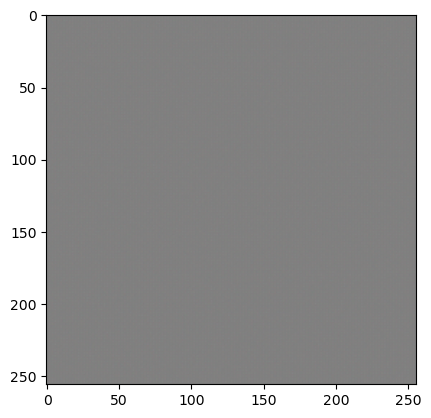

In [27]:
i = t.predict(np.random.rand(1,256,256,3))
plt.imshow((i[0]+1)/2)
plt.show()

# Loss


In [28]:
vgg19 = VGG19(include_top=False, weights='imagenet', input_shape=[256,256,3])
vgg19.trainable = False
for lyr in vgg19.layers:
    lyr.trainable = False
#vgg19.summary()
#plot_model(vgg19, to_file='d_b_c.png', show_shapes=True, show_layer_names=True)

In [29]:
def PerceptualLoss(benchmark_batch, blurry_batch):
    v = Model(inputs=vgg19.input, outputs=vgg19.get_layer('block3_conv4').output)
    v.trainable = False
    return kb.mean(kb.square(v(benchmark_batch)-v(blurry_batch)))

In [30]:
def WassersteinLoss(y_true,y_pred):
	return kb.mean(y_true)*kb.mean(y_pred)

In [31]:
def TranslatorLoss_Model():
    inp = Input(shape=(256,256,3))
    t_out = t(inp)
    d.trainable = False
    d_out,d_out_W = d(t_out)
    tl_m = Model(inputs=inp ,outputs= [t_out,d_out_W,d_out,t_out])
    tl_m.compile(optimizer=Adam(learning_rate, beta_1=0.5,beta_2=0.999),loss=[PerceptualLoss,WassersteinLoss,'binary_crossentropy','mae'],loss_weights=[50,0.00001,0.0001,5])
    d.trainable = True
    return tl_m

In [32]:
tl_m = TranslatorLoss_Model()
tl_m.summary()
plot_model(tl_m,to_file='Tran.png', show_shapes=True, show_layer_names=True,dpi=50)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 model_2 (Functional)        (None, 256, 256, 3)       26517199  
                                                                 
 model (Functional)          [(None, 16, 16, 1),       3917442   
                              (None, 16, 16, 1)]                 
                                                                 
Total params: 30434641 (116.10 MB)
Trainable params: 30420939 (116.05 MB)
Non-trainable params: 13702 (53.52 KB)
_________________________________________________________________
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [33]:
def DiscriminatorLoss_Model():
    inp = Input(shape=(256,256,3))
    d_out,d_out_W = d(inp)
    dl_m = Model(inputs = inp , outputs= [d_out_W,d_out])
    dl_m.compile(optimizer=Adam(learning_rate, beta_1=0.5,beta_2=0.999),loss=[WassersteinLoss,'binary_crossentropy'],loss_weights=[0.5,0.5])
    return dl_m

In [34]:
dl_m = DiscriminatorLoss_Model()
dl_m.summary()
plot_model(dl_m,to_file='Tran.png', show_shapes=True, show_layer_names=True,dpi=50)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 model (Functional)          [(None, 16, 16, 1),       3917442   
                              (None, 16, 16, 1)]                 
                                                                 
Total params: 3917442 (14.94 MB)
Trainable params: 3914626 (14.93 MB)
Non-trainable params: 2816 (11.00 KB)
_________________________________________________________________
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


# Train 1

In [35]:
def train(t_model,d_model,epochs = 10):

    d_cost1,d_cost2,d_cost,t_cost1,t_cost2,t_cost3,t_cost4,t_cost5,d_b_cost1,d_b_cost2=0,0,0,0,0,0,0,0,0,0
    N_batches = m_train//mini_batch_size
    total_batches = N_batches*epochs
    i,j,total_time,flag=1,1,0,0
    start_time = perf_counter()
    for batch in image_data:
        batch = list(batch)
        batch[0] = (batch[0]-127.5)/127.5
        batch[1] = (batch[1]-127.5)/127.5
        batch[0][np.where(batch[0] > 1)]= 1
        batch[0][np.where(batch[0] < -1)]=-1
        batch[1][np.where(batch[1] > 1)]= 1
        batch[1][np.where(batch[1] < -1)]=-1
        t_out = t_model(batch[0])
        d_out_shape = np.random.rand(len(batch[0]),16,16,1)

        Discriminator_Loss1,Wasserstein_Loss_blurry,Adv_loss_blurry = dl_m.train_on_batch(x=t_out,y=[-1*np.ones_like(d_out_shape),np.zeros_like(d_out_shape)])
        Discriminator_Loss2,Wasserstein_Loss_benchmark,Adv_loss_benchmark = dl_m.train_on_batch(x=batch[1],y=[np.ones_like(d_out_shape),np.ones_like(d_out_shape)])
        Discriminator_Loss = Discriminator_Loss1+Discriminator_Loss2
        d_costs_benchmark_W.append(Wasserstein_Loss_benchmark)
        d_costs_blurry_W.append(Wasserstein_Loss_blurry)
        d_costs_benchmark_b_c.append(Adv_loss_benchmark)
        d_costs_blurry_b_c.append(Adv_loss_blurry)
        d_costs.append(Discriminator_Loss)
        d_cost1 += Wasserstein_Loss_benchmark
        d_cost2 += Wasserstein_Loss_blurry
        d_b_cost1 += Adv_loss_benchmark
        d_b_cost2 += Adv_loss_blurry
        d_cost += Discriminator_Loss

        dl_m.trainable = False
        Translator_Loss, Perceptual_Loss,Wasserstein_Loss,Adv_loss,L1_loss  = tl_m.train_on_batch(x=batch[0],y=[batch[1],np.ones_like(d_out_shape),np.ones_like(d_out_shape),batch[1]])
        dl_m.trainable = True
        t_costs_b_c.append(Adv_loss)
        t_costs_W.append(Wasserstein_Loss)
        t_costs_l1.append(L1_loss)
        t_costs_P.append(Perceptual_Loss)
        t_costs.append(Translator_Loss)
        t_cost1 += Perceptual_Loss
        t_cost2 += Wasserstein_Loss
        t_cost3 += Adv_loss
        t_cost4 += L1_loss
        t_cost5 += Translator_Loss


        tst = t.predict(ppp)
        tst = (tst+1)/2.0
        tst = np.reshape(np.array(tst),(256,256,3))
        b.append(tst)

        if j<=20 and flag==0:
            end_time = perf_counter()
            total_time = total_time + (end_time-start_time)
            start_time = perf_counter()
        if j==20 and flag==0:
            total_time = total_time/20
            total_time = total_time*total_batches
            print(convert(total_time))
            flag=1
        if j==N_batches:
            j=0
            d_cost1 = d_cost1/N_batches
            d_cost2 = d_cost2/N_batches
            d_b_cost1 = d_b_cost1/N_batches
            d_b_cost2 = d_b_cost2/N_batches
            d_cost = d_cost/N_batches
            t_cost1 = t_cost1/N_batches
            t_cost2 = t_cost2/N_batches
            t_cost3 = t_cost3/N_batches
            t_cost4 = t_cost4/N_batches
            t_cost5 = t_cost5/N_batches
            print("Epochs : "+str(i) + " : DIS_COST  "+str(d_cost)+'(DL) | '+str(d_cost1)+'(W_R) , '+str(d_cost2)+'(W_F) , '+str(d_b_cost1)+'(B_C_R) , '+str(d_b_cost2)+'(B_C_F)')
            print("Epochs : "+str(i) + " : GEN_COST  "+str(t_cost5)+'(TL) | '+str(t_cost1)+'(P) , '+str(t_cost2)+'(W) , '+str(t_cost3)+'(B_C) , '+str(t_cost4)+'(L1)' )
            a = random.randint(0,batch[0].shape[0]-1)
            tst_img = t_model.predict(batch[0][a:a+1,:,:,:])
            tst_img = np.reshape(np.array(tst_img),(256,256,3))
            tst_img_b = np.reshape(np.array(batch[0][a:a+1,:,:,:]),(256,256,3))
            tst_img_bn = np.reshape(np.array(batch[1][a:a+1,:,:,:]),(256,256,3))
            tst_img = (tst_img+1)/2.0
            tst_img_b = (tst_img_b+1)/2.0
            tst_img_bn = (tst_img_bn+1)/2.0
            plt.axis('off')
            plt.subplot(1,3,1),plt.imshow(tst_img_b)
            plt.axis('off')
            plt.subplot(1,3,2),plt.imshow(tst_img_bn)
            plt.axis('off')
            plt.subplot(1,3,3),plt.imshow(tst_img)
            plt.xticks([]),plt.yticks([])
            plt.show()
            d_cost1,d_cost2,d_cost,t_cost1,t_cost2,t_cost3,t_cost4,t_cost5,d_b_cost1,d_b_cost2=0,0,0,0,0,0,0,0,0,0
            epochs=epochs-1
            i=i+1
            if epochs==0:
                break
        j=j+1
    print('Congratulations,Your model is successfully trained.')
    return

In [36]:
def plot_cost_curve():

    epoch = [i for i in range(1,len(t_costs_P)+1)]

    d_costs_benchmark_b_c_smooth = gaussian_filter1d(d_costs_benchmark_b_c, sigma=9)
    d_costs_blurry_b_c_smooth = gaussian_filter1d(d_costs_blurry_b_c, sigma=9)
    plt.plot(epoch,d_costs_benchmark_b_c_smooth,color='green',linewidth = 0.5,label = "Sharp Images")
    plt.plot(epoch,d_costs_blurry_b_c_smooth,color='black',linewidth = 0.5,label = "Deblurred Images")
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title("Discriminator Binary Crossentropy Loss")
    plt.legend()
    plt.show()

    d_costs_benchmark_W_smooth = gaussian_filter1d(d_costs_benchmark_W, sigma=9)
    d_costs_blurry_W_smooth = gaussian_filter1d(d_costs_blurry_W, sigma=9)
    plt.plot(epoch,d_costs_benchmark_W_smooth,color='green',linewidth = 0.5,label = "Sharp Images")
    plt.plot(epoch,d_costs_blurry_W_smooth,color='black',linewidth = 0.5,label = "Deblurred Images")
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Discriminator Wasserstein Loss')
    plt.legend()
    plt.show()

    t_costs_b_c_smooth = gaussian_filter1d(t_costs_b_c, sigma=9)
    plt.plot(epoch,t_costs_b_c_smooth,color='blue',linewidth = 0.5)
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Translator Binary Crossentropy Loss')
    plt.legend()
    plt.show()

    t_costs_P_smooth = gaussian_filter1d(t_costs_P, sigma=9)
    plt.plot(epoch,t_costs_P_smooth,color='green',linewidth = 0.5)
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Translator Perceptual Loss')
    plt.legend()
    plt.show()

    t_costs_W_smooth = gaussian_filter1d(t_costs_W, sigma=9)
    plt.plot(epoch,t_costs_W_smooth,color='blue',linewidth = 0.5)
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Translator Wasserstein Loss')
    plt.legend()
    plt.show()

    t_costs_l1_smooth = gaussian_filter1d(t_costs_l1, sigma=9)
    plt.plot(epoch,t_costs_l1_smooth,color='green',linewidth = 0.5)
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Translator L1 Loss (MAE)')
    plt.legend()
    plt.show()

    t_costs_smooth = gaussian_filter1d(t_costs, sigma=9)
    plt.plot(epoch,t_costs_smooth,color='blue',linewidth = 0.5)
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Translator Loss')
    plt.legend()
    plt.show()

    d_costs_smooth = gaussian_filter1d(d_costs, sigma=9)
    plt.plot(epoch,d_costs_smooth,color='green',linewidth = 0.5)
    plt.ylabel('Cost')
    plt.xlabel('Number of batches')
    plt.title('Discriminator Loss')
    plt.legend()
    plt.show()


# Train 2

In [37]:
d_costs_benchmark_W=[]
d_costs_blurry_W=[]
d_costs_benchmark_b_c=[]
d_costs_blurry_b_c=[]
t_costs_b_c=[]
t_costs_l1=[]
t_costs_W=[]
t_costs_P=[]
t_costs = []
d_costs = []
b = []

2023-12-27 11:26:50.030902: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f5954070e30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-12-27 11:26:50.030924: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2023-12-27 11:26:50.038009: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1703656610.103279  951270 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2023-12-27 11:26:50.348566: W external/local_tsl/tsl/framework/bfc_allocator.cc:366] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the 

1/1 [==============================] - 0s 16ms/step
Approx Time Required = 4:26:25
1/1 [==============================] - 0s 12ms/step
Epochs : 1 : DIS_COST  -0.3669576210004312(DL) | 0.08071018401015964(W_R) , -2.509831557340092(W_F) , 0.6198537548383077(B_C_R) , 1.075352375595658(B_C_F)
Epochs : 1 : GEN_COST  9383.649077690972(TL) | 187.61444967764396(P) , 0.05945748729993486(W) , 0.6727638244628906(B_C) , 0.5853263139724731(L1)
1/1 [==============================] - 0s 12ms/step


/tmp/ipykernel_951197/63376323.py:85: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,3,1),plt.imshow(tst_img_b)


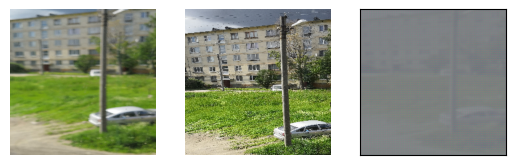

1/1 [==============================] - 0s 13ms/step
Epochs : 2 : DIS_COST  -2.1109796435744674(DL) | 0.04280826934803001(W_R) , -5.613126987881131(W_F) , 0.668028285768297(B_C_R) , 0.6803311405358491(B_C_F)
Epochs : 2 : GEN_COST  7957.469916449652(TL) | 159.09461076524522(P) , 1.8401403630221331(W) , 0.7195526780905547(B_C) , 0.5478733515297926(L1)
1/1 [==============================] - 0s 12ms/step


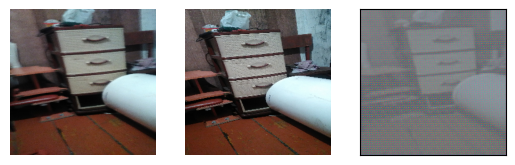

1/1 [==============================] - 0s 13ms/step
Epochs : 3 : DIS_COST  -3.847005256017049(DL) | 0.06037190446837081(W_R) , -9.054887178209093(W_F) , 0.7013823005888197(B_C_R) , 0.5991224478792261(B_C_F)
Epochs : 3 : GEN_COST  7679.6802915219905(TL) | 153.54027707135236(P) , 3.245251727104187(W) , 0.7752412456053275(B_C) , 0.5332887378003862(L1)
1/1 [==============================] - 0s 12ms/step


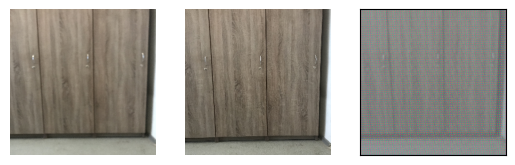

1/1 [==============================] - 0s 13ms/step
Epochs : 4 : DIS_COST  -5.735624802995611(DL) | 0.07887727572815492(W_R) , -12.829574719181768(W_F) , 0.7043719388820507(B_C_R) , 0.5750759045282999(B_C_F)
Epochs : 4 : GEN_COST  7579.663161892361(TL) | 151.54042426215278(P) , 3.5492828863638417(W) , 0.7590636827327587(B_C) , 0.5283934105325628(L1)
1/1 [==============================] - 0s 12ms/step


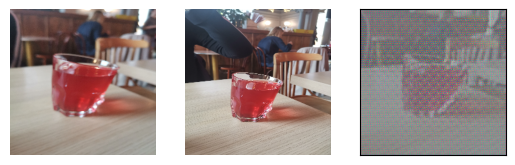

1/1 [==============================] - 0s 14ms/step
Epochs : 5 : DIS_COST  -7.740610847208235(DL) | 0.09485387145110441(W_R) , -16.83795711376049(W_F) , 0.6986280670872441(B_C_R) , 0.5632534654052169(B_C_F)
Epochs : 5 : GEN_COST  7511.261416739005(TL) | 150.1721622325756(P) , 4.623463669088152(W) , 0.7538841905417266(B_C) , 0.5306596782472398(L1)
1/1 [==============================] - 0s 13ms/step


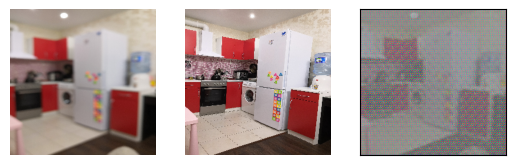

1/1 [==============================] - 0s 13ms/step
Epochs : 6 : DIS_COST  -9.938708159437885(DL) | 0.12551438822497235(W_R) , -21.24600899307816(W_F) , 0.6933150684392011(B_C_R) , 0.5497632291581895(B_C_F)
Epochs : 6 : GEN_COST  7390.620623553241(TL) | 147.75941410771122(P) , 5.4041383151654845(W) , 0.7382075609984221(B_C) , 0.5299875383023862(L1)
1/1 [==============================] - 0s 13ms/step


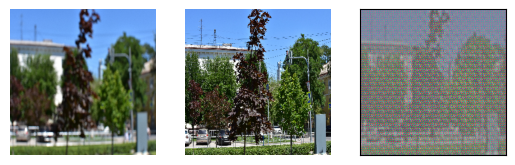

1/1 [==============================] - 0s 12ms/step
Epochs : 7 : DIS_COST  -12.192201319005754(DL) | 0.18649138183930147(W_R) , -25.80141619929561(W_F) , 0.6901236176490784(B_C_R) , 0.5403985756414907(B_C_F)
Epochs : 7 : GEN_COST  7338.996994357639(TL) | 146.72680031105324(P) , 5.239424815001311(W) , 0.7413594674181055(B_C) , 0.5313913561679698(L1)
1/1 [==============================] - 0s 13ms/step


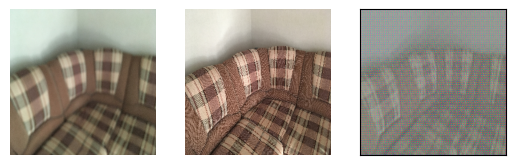

1/1 [==============================] - 0s 14ms/step
Epochs : 8 : DIS_COST  -14.683230807604613(DL) | 0.16555304894292797(W_R) , -30.752903662787542(W_F) , 0.6860024628815827(B_C_R) , 0.5348866330252753(B_C_F)
Epochs : 8 : GEN_COST  7294.519636140047(TL) | 145.83745950769494(P) , 8.628496280429816(W) , 0.786434288819631(B_C) , 0.5293288184536828(L1)
1/1 [==============================] - 0s 14ms/step


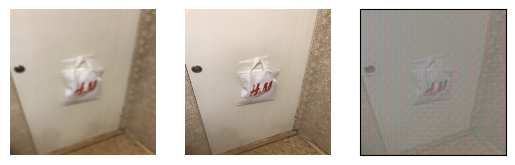

1/1 [==============================] - 0s 13ms/step
Epochs : 9 : DIS_COST  -17.283323810718677(DL) | 0.1852401291281071(W_R) , -35.956012923629196(W_F) , 0.6774716712810375(B_C_R) , 0.5266535547044542(B_C_F)
Epochs : 9 : GEN_COST  7249.94912109375(TL) | 144.94580696953668(P) , 8.874244497661238(W) , 0.7647249460220337(B_C) , 0.5317555200170587(L1)
1/1 [==============================] - 0s 12ms/step


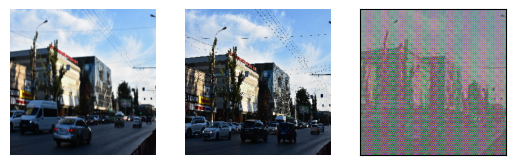

1/1 [==============================] - 0s 12ms/step
Epochs : 10 : DIS_COST  -19.927492020306765(DL) | 0.26147422831315825(W_R) , -41.31440570972584(W_F) , 0.6770486911137898(B_C_R) , 0.5208985898229811(B_C_F)
Epochs : 10 : GEN_COST  7148.383921079282(TL) | 142.91497599283855(P) , 9.59291016984455(W) , 0.7701489444132205(B_C) , 0.5270259545909034(L1)
1/1 [==============================] - 0s 12ms/step


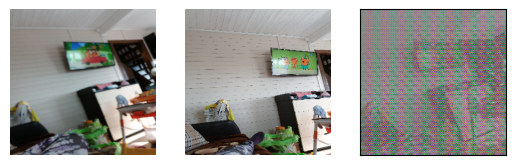

1/1 [==============================] - 0s 12ms/step
Epochs : 11 : DIS_COST  -22.765244389242596(DL) | 0.3106691878671646(W_R) , -47.02841799700702(W_F) , 0.6749051248585737(B_C_R) , 0.5123549306834185(B_C_F)
Epochs : 11 : GEN_COST  7117.093773509838(TL) | 142.28876859876846(P) , 9.265478766406025(W) , 0.7536350969915037(B_C) , 0.5310696016859126(L1)
1/1 [==============================] - 0s 14ms/step


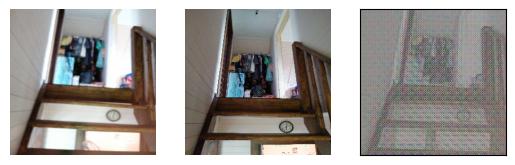

1/1 [==============================] - 0s 13ms/step
Epochs : 12 : DIS_COST  -25.738135283743894(DL) | 0.3020848694150724(W_R) , -52.94847649468316(W_F) , 0.6638333333863152(B_C_R) , 0.5062877889032718(B_C_F)
Epochs : 12 : GEN_COST  7075.089304832176(TL) | 141.44844699435765(P) , 10.72568235711919(W) , 0.7509049389097425(B_C) , 0.533395297659768(L1)
1/1 [==============================] - 0s 12ms/step


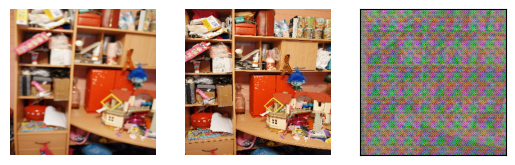

1/1 [==============================] - 0s 14ms/step
Epochs : 13 : DIS_COST  -28.589578134925276(DL) | 0.49697564704930064(W_R) , -58.85923809475369(W_F) , 0.670948702317697(B_C_R) , 0.5121574737407543(B_C_F)
Epochs : 13 : GEN_COST  6920.966932508681(TL) | 138.36628530996816(P) , 13.20191882716285(W) , 0.738545674306375(B_C) , 0.5305289520157708(L1)
1/1 [==============================] - 0s 13ms/step


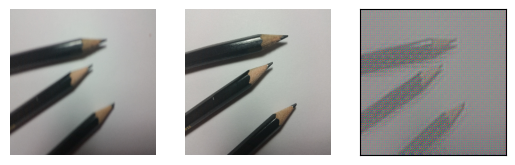

1/1 [==============================] - 0s 13ms/step
Epochs : 14 : DIS_COST  -31.809135795743376(DL) | 0.3678262953700377(W_R) , -65.14078092221861(W_F) , 0.6580426295598348(B_C_R) , 0.4966402954525418(B_C_F)
Epochs : 14 : GEN_COST  6884.807510489005(TL) | 137.64275902642143(P) , 13.99701364658497(W) , 0.7205200120254799(B_C) , 0.5339129699601067(L1)
1/1 [==============================] - 0s 13ms/step


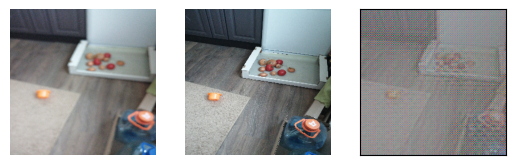

1/1 [==============================] - 0s 14ms/step
Epochs : 15 : DIS_COST  -34.97199220524894(DL) | 0.37894403301351876(W_R) , -71.47396132857712(W_F) , 0.655675741036733(B_C_R) , 0.49535716198108815(B_C_F)
Epochs : 15 : GEN_COST  6781.931233723958(TL) | 135.58541265417028(P) , 31.670939060935268(W) , 0.7456535599849842(B_C) , 0.5320635559382262(L1)
1/1 [==============================] - 0s 14ms/step


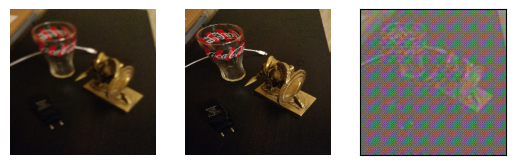

1/1 [==============================] - 0s 13ms/step
Epochs : 16 : DIS_COST  -38.37240012906216(DL) | 0.5191166517807654(W_R) , -78.41534655535662(W_F) , 0.6605622547644155(B_C_R) , 0.49086791431462323(B_C_F)
Epochs : 16 : GEN_COST  6685.630049189815(TL) | 133.65928582085505(P) , 20.217983486034253(W) , 0.7306833655745895(B_C) , 0.5331316559403031(L1)
1/1 [==============================] - 0s 13ms/step


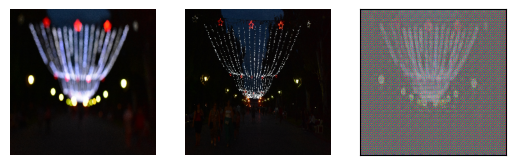

1/1 [==============================] - 0s 13ms/step
Epochs : 17 : DIS_COST  -41.78655236981533(DL) | 0.47702112268415037(W_R) , -85.19299841986762(W_F) , 0.6537893184909114(B_C_R) , 0.48908367532270924(B_C_F)
Epochs : 17 : GEN_COST  6559.169156901042(TL) | 131.13032754968714(P) , 19.232280249065823(W) , 0.7202652913552744(B_C) , 0.5305351714293162(L1)
1/1 [==============================] - 0s 13ms/step


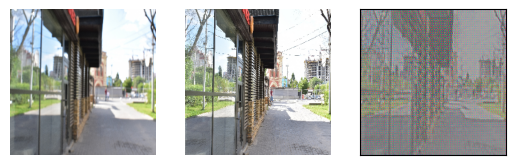

1/1 [==============================] - 0s 13ms/step
Epochs : 18 : DIS_COST  -45.407498445334255(DL) | 0.6109351285526322(W_R) , -92.56189450864439(W_F) , 0.652318889564938(B_C_R) , 0.4836436359970658(B_C_F)
Epochs : 18 : GEN_COST  6461.462563295718(TL) | 129.1761138068305(P) , 21.36420093289128(W) , 0.7198463197107668(B_C) , 0.5313564563239063(L1)
1/1 [==============================] - 0s 12ms/step


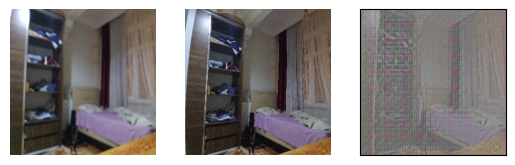

1/1 [==============================] - 0s 13ms/step
Epochs : 19 : DIS_COST  -48.90709160080662(DL) | 0.666210653686344(W_R) , -99.62949331778067(W_F) , 0.6583009053159643(B_C_R) , 0.49079874356587727(B_C_F)
Epochs : 19 : GEN_COST  6320.843191189236(TL) | 126.36382081773546(P) , 22.031961584091185(W) , 0.6838705570609481(B_C) , 0.5304000282729113(L1)
1/1 [==============================] - 0s 14ms/step


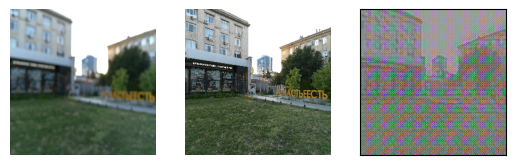

1/1 [==============================] - 0s 13ms/step
Epochs : 20 : DIS_COST  -52.57149821166639(DL) | 0.6008897612604347(W_R) , -106.88548640498409(W_F) , 0.6537745281502053(B_C_R) , 0.4878256886093705(B_C_F)
Epochs : 20 : GEN_COST  6150.458857783565(TL) | 122.95597237481012(P) , 26.382911378365975(W) , 0.695612797913728(B_C) , 0.5319951287022343(L1)
1/1 [==============================] - 0s 13ms/step


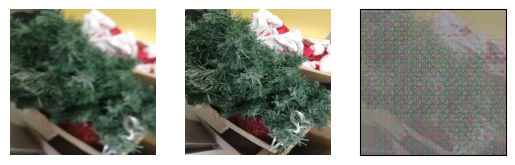

1/1 [==============================] - 0s 13ms/step
Epochs : 21 : DIS_COST  -56.20778204048121(DL) | 0.8786328776153149(W_R) , -114.44090966118706(W_F) , 0.6568945482925133(B_C_R) , 0.4898181844640661(B_C_F)
Epochs : 21 : GEN_COST  6034.303220847801(TL) | 120.63297158700449(P) , 31.382410081227622(W) , 0.7107168078422547(B_C) , 0.530863951532929(L1)
1/1 [==============================] - 0s 13ms/step


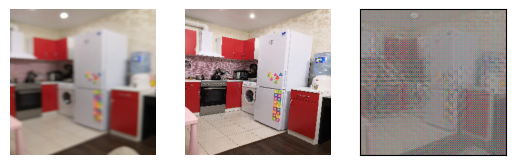

1/1 [==============================] - 0s 16ms/step
Epochs : 22 : DIS_COST  -60.31193465148961(DL) | 0.6800108101805327(W_R) , -122.44534539116754(W_F) , 0.6513281654428553(B_C_R) , 0.49013743069436816(B_C_F)
Epochs : 22 : GEN_COST  5876.263286675347(TL) | 117.4720900076407(P) , 26.55751530682599(W) , 0.7130531801117791(B_C) , 0.5316972926810936(L1)
1/1 [==============================] - 0s 15ms/step


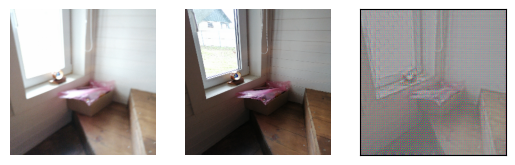

1/1 [==============================] - 0s 13ms/step
Epochs : 23 : DIS_COST  -64.03150748036526(DL) | 0.955759267617638(W_R) , -130.16450184009693(W_F) , 0.6538809484905667(B_C_R) , 0.49184726719503047(B_C_F)
Epochs : 23 : GEN_COST  5755.113852719907(TL) | 115.04897585268374(P) , 41.281601199397336(W) , 0.7507722386607417(B_C) , 0.532926450835334(L1)
1/1 [==============================] - 0s 14ms/step


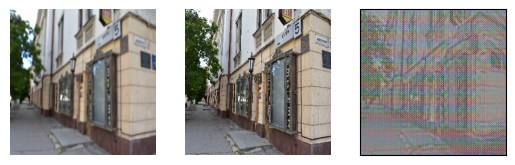

1/1 [==============================] - 0s 14ms/step
Epochs : 24 : DIS_COST  -68.1971172021495(DL) | 0.7499840528057474(W_R) , -138.28025987413196(W_F) , 0.6470645984013875(B_C_R) , 0.4889770845572154(B_C_F)
Epochs : 24 : GEN_COST  5568.704143156829(TL) | 111.32112698025173(P) , 37.71106852072256(W) , 0.70351344037939(B_C) , 0.5294791981025978(L1)
1/1 [==============================] - 0s 14ms/step


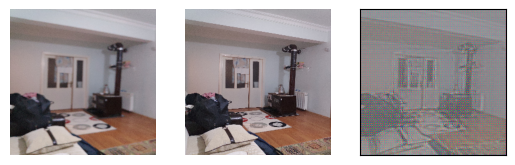

1/1 [==============================] - 0s 16ms/step
Epochs : 25 : DIS_COST  -72.19259496242911(DL) | 0.9137237784556217(W_R) , -146.43447231716578(W_F) , 0.6485298333344636(B_C_R) , 0.4870284559550109(B_C_F)
Epochs : 25 : GEN_COST  5414.932190393519(TL) | 108.24548481128834(P) , 29.271422689932365(W) , 0.6786599830344872(B_C) , 0.5315365654450875(L1)
1/1 [==============================] - 0s 13ms/step


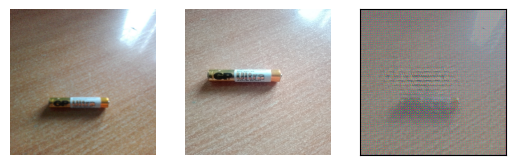

1/1 [==============================] - 0s 13ms/step
Epochs : 26 : DIS_COST  -76.53681383552374(DL) | 0.8674212082461626(W_R) , -155.06531598126446(W_F) , 0.6414286070399814(B_C_R) , 0.4828382368440981(B_C_F)
Epochs : 26 : GEN_COST  5289.122357855903(TL) | 105.72929252341942(P) , 25.38667123582628(W) , 0.6846954438421461(B_C) , 0.5315021093244906(L1)
1/1 [==============================] - 0s 13ms/step


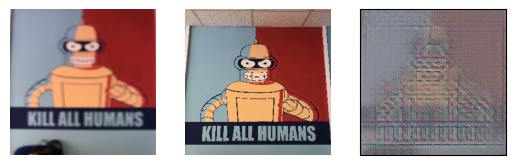

1/1 [==============================] - 0s 12ms/step
Epochs : 27 : DIS_COST  -80.89473188011735(DL) | 1.0241609361988526(W_R) , -163.93794612178095(W_F) , 0.6443591528468662(B_C_R) , 0.47996151557675115(B_C_F)
Epochs : 27 : GEN_COST  5156.592880135995(TL) | 103.07868739940503(P) , 41.56236823753074(W) , 0.6987814289552194(B_C) , 0.5316095557477739(L1)
1/1 [==============================] - 0s 13ms/step


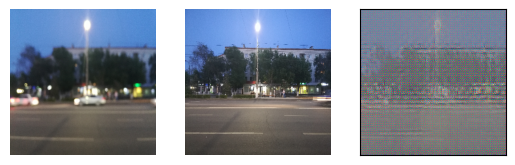

1/1 [==============================] - 0s 13ms/step
Epochs : 28 : DIS_COST  -85.21008189254337(DL) | 1.0846570086286025(W_R) , -172.62749656394675(W_F) , 0.6432596537801955(B_C_R) , 0.4794163520689364(B_C_F)
Epochs : 28 : GEN_COST  5017.882779947917(TL) | 100.30431425306531(P) , 39.48426348015114(W) , 0.6212347984313965(B_C) , 0.5333214258706128(L1)
1/1 [==============================] - 0s 14ms/step


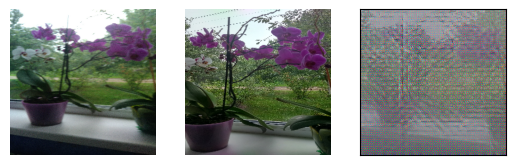

1/1 [==============================] - 0s 13ms/step
Epochs : 29 : DIS_COST  -89.36712372170554(DL) | 1.3741705192597928(W_R) , -181.23593987358942(W_F) , 0.6436991660683243(B_C_R) , 0.48382313935844984(B_C_F)
Epochs : 29 : GEN_COST  4863.807575593171(TL) | 97.22286320439092(P) , 34.91712893733272(W) , 0.626732760005527(B_C) , 0.5328141031441865(L1)
1/1 [==============================] - 0s 14ms/step


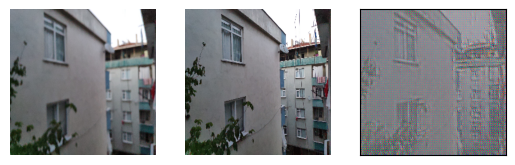

1/1 [==============================] - 0s 15ms/step
Epochs : 30 : DIS_COST  -94.07540309561624(DL) | 1.1156565506563143(W_R) , -190.3917663574219(W_F) , 0.6428608355698762(B_C_R) , 0.4824425260225932(B_C_F)
Epochs : 30 : GEN_COST  4764.008248336227(TL) | 95.22714261655454(P) , 18.44203967253367(W) , 0.5926529990302192(B_C) , 0.5302003513883662(L1)
1/1 [==============================] - 0s 14ms/step


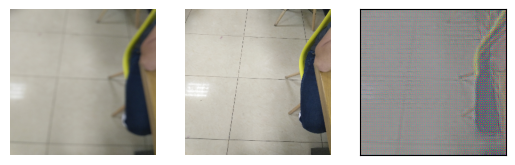

1/1 [==============================] - 0s 15ms/step
Epochs : 31 : DIS_COST  -98.47644578284688(DL) | 1.3506880577239726(W_R) , -199.4283650716146(W_F) , 0.6409295815008658(B_C_R) , 0.48385581926063254(B_C_F)
Epochs : 31 : GEN_COST  4621.547044994213(TL) | 92.37759249651873(P) , 16.762989870707194(W) , 0.622104490686346(B_C) , 0.5334624036594674(L1)
1/1 [==============================] - 0s 14ms/step


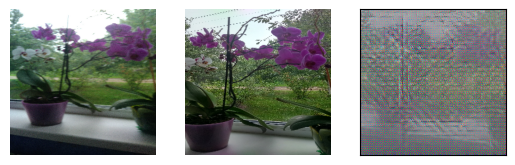

1/1 [==============================] - 0s 14ms/step
Epochs : 32 : DIS_COST  -103.33510981709868(DL) | 1.1325549473917043(W_R) , -208.92262787995514(W_F) , 0.6398897793557908(B_C_R) , 0.4799639768070645(B_C_F)
Epochs : 32 : GEN_COST  4505.160721390335(TL) | 90.04995460510254(P) , 32.19210891900239(W) , 0.6319346335199144(B_C) , 0.5325390645751247(L1)
1/1 [==============================] - 0s 14ms/step


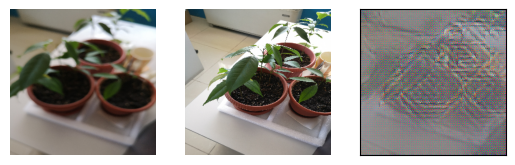

1/1 [==============================] - 0s 13ms/step
Epochs : 33 : DIS_COST  -108.17317644158999(DL) | 1.2481432999242787(W_R) , -218.70967576768663(W_F) , 0.6359876001322711(B_C_R) , 0.47919227105599865(B_C_F)
Epochs : 33 : GEN_COST  4364.108416521991(TL) | 87.22903747558594(P) , 24.933057776203864(W) , 0.6229189091258579(B_C) , 0.5312642689104433(L1)
1/1 [==============================] - 0s 13ms/step


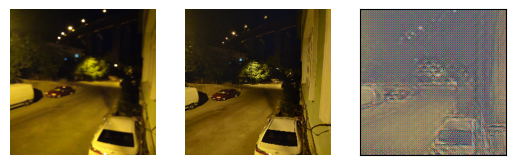

1/1 [==============================] - 0s 13ms/step
Epochs : 34 : DIS_COST  -112.92225025737727(DL) | 1.4724276337427673(W_R) , -228.43354300039786(W_F) , 0.6380763972247089(B_C_R) , 0.47853829816535665(B_C_F)
Epochs : 34 : GEN_COST  4295.709490740741(TL) | 85.86072475292065(P) , 42.450038016283955(W) , 0.6352764822818615(B_C) , 0.5345702484801963(L1)
1/1 [==============================] - 0s 12ms/step


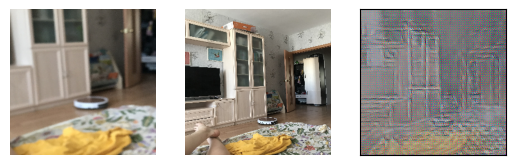

1/1 [==============================] - 0s 13ms/step
Epochs : 35 : DIS_COST  -118.06349898488433(DL) | 1.218385474908131(W_R) , -238.4577726010923(W_F) , 0.6369182833918818(B_C_R) , 0.4754711056197131(B_C_F)
Epochs : 35 : GEN_COST  4145.645017722801(TL) | 82.85991052698206(P) , 25.353942818111843(W) , 0.6424121746310482(B_C) , 0.5298475002800976(L1)
1/1 [==============================] - 0s 14ms/step


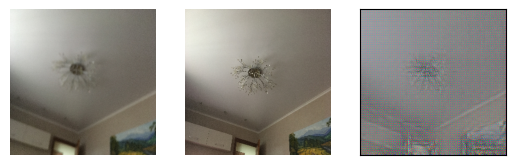

1/1 [==============================] - 0s 13ms/step
Epochs : 36 : DIS_COST  -122.39813744646531(DL) | 2.0042983301811748(W_R) , -247.92124565972222(W_F) , 0.6389338188701206(B_C_R) , 0.4817386653688219(B_C_F)
Epochs : 36 : GEN_COST  4109.988527199074(TL) | 82.14621248598452(P) , 53.06928519496211(W) , 0.6811948767414799(B_C) , 0.5354770750911148(L1)
1/1 [==============================] - 0s 13ms/step


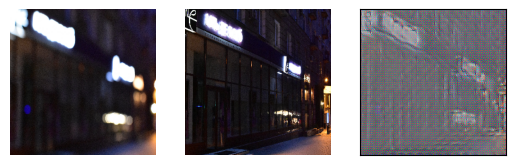

1/1 [==============================] - 0s 15ms/step
Epochs : 37 : DIS_COST  -127.75608651660107(DL) | 1.459856510879817(W_R) , -258.0885363543475(W_F) , 0.637902910621078(B_C_R) , 0.4786049169522745(B_C_F)
Epochs : 37 : GEN_COST  3977.71995171441(TL) | 79.5011606004503(P) , 88.72754732767741(W) , 0.5994548885910599(B_C) , 0.5322072704633077(L1)
1/1 [==============================] - 0s 15ms/step


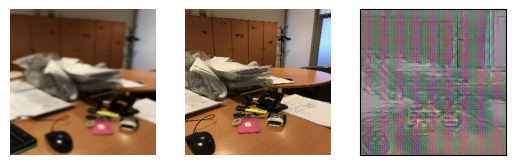

1/1 [==============================] - 0s 15ms/step
Epochs : 38 : DIS_COST  -132.7971912044066(DL) | 2.009445686583166(W_R) , -268.7191390426071(W_F) , 0.6383883458596689(B_C_R) , 0.4769219981299506(B_C_F)
Epochs : 38 : GEN_COST  3863.313624855324(TL) | 77.2131290294506(P) , 59.9158043967353(W) , 0.5944862476101628(B_C) , 0.5313149977613378(L1)
1/1 [==============================] - 0s 15ms/step


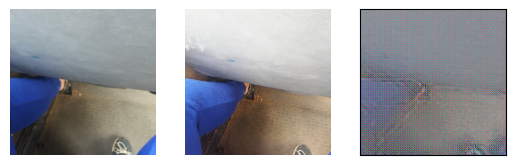

1/1 [==============================] - 0s 14ms/step
Epochs : 39 : DIS_COST  -138.31857836114037(DL) | 1.3737569527441842(W_R) , -279.11941211841724(W_F) , 0.6321104601577476(B_C_R) , 0.47638791380105194(B_C_F)
Epochs : 39 : GEN_COST  3770.8189878110534(TL) | 75.3634745279948(P) , 27.33713695914657(W) , 0.5865162253379822(B_C) , 0.5289990153577593(L1)
1/1 [==============================] - 0s 14ms/step


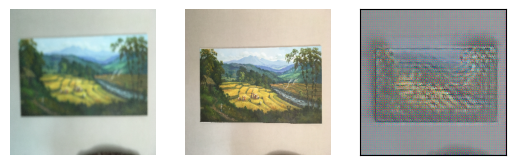

1/1 [==============================] - 0s 14ms/step
Epochs : 40 : DIS_COST  -143.59389640909654(DL) | 1.7376947618469043(W_R) , -290.0313397442853(W_F) , 0.6317168394724528(B_C_R) , 0.4741366750664181(B_C_F)
Epochs : 40 : GEN_COST  3691.0573169849536(TL) | 73.76795063725224(P) , 57.228467047656025(W) , 0.5858646995491452(B_C) , 0.531843567777563(L1)
1/1 [==============================] - 0s 14ms/step


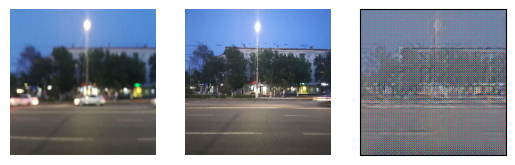

1/1 [==============================] - 0s 13ms/step
Epochs : 41 : DIS_COST  -148.8741526780305(DL) | 1.8200843059906253(W_R) , -300.6702715838397(W_F) , 0.6302011101334183(B_C_R) , 0.47168074206069666(B_C_F)
Epochs : 41 : GEN_COST  3594.953054470486(TL) | 71.84594599405925(P) , 51.22949705477114(W) , 0.5971275470874927(B_C) , 0.5310512286645395(L1)
1/1 [==============================] - 0s 13ms/step


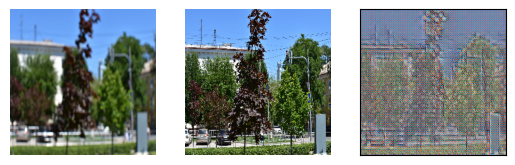

1/1 [==============================] - 0s 13ms/step
Epochs : 42 : DIS_COST  -154.41474784259444(DL) | 1.5982805774167732(W_R) , -311.52266981336805(W_F) , 0.6255671068474099(B_C_R) , 0.46932551286838675(B_C_F)
Epochs : 42 : GEN_COST  3506.683996129919(TL) | 70.08057761015715(P) , 42.67952019020363(W) , 0.5870207868240498(B_C) , 0.530934766707597(L1)
1/1 [==============================] - 0s 12ms/step


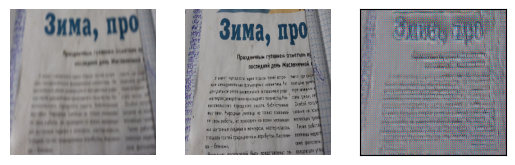

1/1 [==============================] - 0s 12ms/step
Epochs : 43 : DIS_COST  -159.8494027144379(DL) | 1.8367098907629649(W_R) , -322.634221733941(W_F) , 0.6280921242855213(B_C_R) , 0.47061353546601753(B_C_F)
Epochs : 43 : GEN_COST  3453.759816261574(TL) | 69.02193790011935(P) , 34.99871624134205(W) , 0.6139433476659987(B_C) , 0.5325142948715775(L1)
1/1 [==============================] - 0s 13ms/step


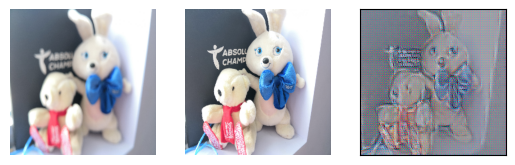

1/1 [==============================] - 0s 13ms/step
Epochs : 44 : DIS_COST  -165.44044601961417(DL) | 2.129929735628819(W_R) , -334.1096718117043(W_F) , 0.6290194736586676(B_C_R) , 0.4698312902892077(B_C_F)
Epochs : 44 : GEN_COST  3372.246553096065(TL) | 67.39180148089373(P) , 77.81186464097765(W) , 0.7064633908095184(B_C) , 0.5311407031836333(L1)
1/1 [==============================] - 0s 14ms/step


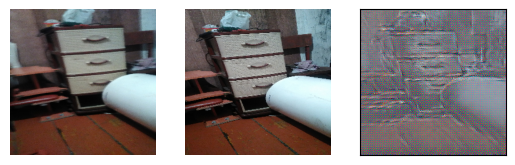

1/1 [==============================] - 0s 15ms/step
Epochs : 45 : DIS_COST  -171.31582603564968(DL) | 1.7945916111270586(W_R) , -345.5207388418692(W_F) , 0.6251892844835917(B_C_R) , 0.4693048044487282(B_C_F)
Epochs : 45 : GEN_COST  3289.084582067419(TL) | 65.72880161426686(P) , 76.63768263216372(W) , 0.6556861722910846(B_C) , 0.5287452750735813(L1)
1/1 [==============================] - 0s 15ms/step


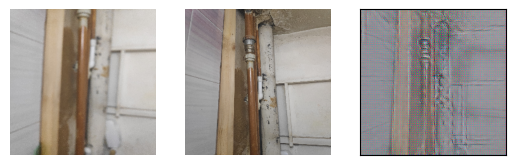

1/1 [==============================] - 0s 15ms/step
Epochs : 46 : DIS_COST  -176.87573583081917(DL) | 2.0939451060913226(W_R) , -356.9360609266493(W_F) , 0.6229570909782692(B_C_R) , 0.4676868672724123(B_C_F)
Epochs : 46 : GEN_COST  3228.0228859230324(TL) | 64.50747318974247(P) , 32.752121176543056(W) , 0.634496248209918(B_C) , 0.5297785796501019(L1)
1/1 [==============================] - 0s 17ms/step


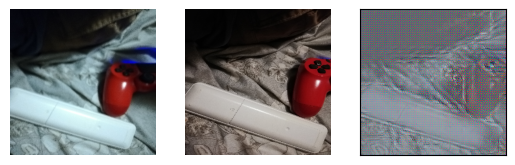

1/1 [==============================] - 0s 13ms/step
Epochs : 47 : DIS_COST  -182.75215127931702(DL) | 2.241062388927848(W_R) , -368.831186026114(W_F) , 0.6218288739522299(B_C_R) , 0.4639921930101183(B_C_F)
Epochs : 47 : GEN_COST  3156.864924225984(TL) | 63.084519167299625(P) , 15.597625860461482(W) , 0.6155210985077753(B_C) , 0.527759912499675(L1)
1/1 [==============================] - 0s 14ms/step


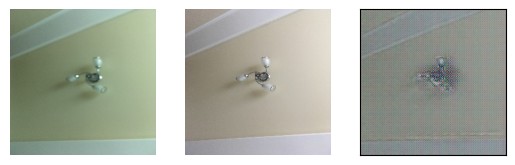

1/1 [==============================] - 0s 14ms/step
Epochs : 48 : DIS_COST  -188.22166723476516(DL) | 2.029829493054637(W_R) , -379.5581292046441(W_F) , 0.6185928843639515(B_C_R) , 0.46637211640675863(B_C_F)
Epochs : 48 : GEN_COST  3096.310046838831(TL) | 61.87330260100188(P) , 13.723577518816347(W) , 0.6719817892268852(B_C) , 0.5289605363651558(L1)
1/1 [==============================] - 0s 13ms/step


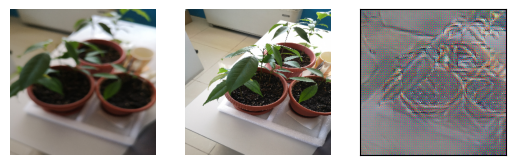

1/1 [==============================] - 0s 13ms/step
Epochs : 49 : DIS_COST  -193.7306474632687(DL) | 2.6150787583103887(W_R) , -391.1651803475839(W_F) , 0.6159614223021048(B_C_R) , 0.47284615282659176(B_C_F)
Epochs : 49 : GEN_COST  3027.677730758102(TL) | 60.500724142569084(P) , 213.19057639793112(W) , 0.7731765530727528(B_C) , 0.5278746494540462(L1)
1/1 [==============================] - 0s 13ms/step


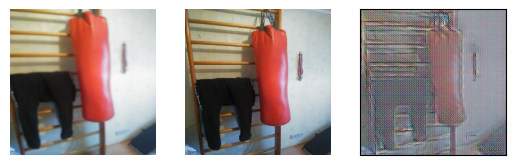

1/1 [==============================] - 0s 12ms/step
Epochs : 50 : DIS_COST  -200.37961895200942(DL) | 2.2350768962392102(W_R) , -404.0683754249855(W_F) , 0.6123091008928087(B_C_R) , 0.4617519974708557(B_C_F)
Epochs : 50 : GEN_COST  2965.951609519676(TL) | 59.26622130782516(P) , 128.20678578129522(W) , 0.6083027393729599(B_C) , 0.5278473474361278(L1)
1/1 [==============================] - 0s 13ms/step


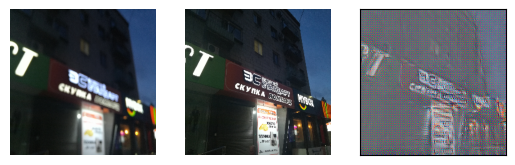

1/1 [==============================] - 0s 13ms/step
Epochs : 51 : DIS_COST  -206.4750443469595(DL) | 2.2285869404949525(W_R) , -416.2518213342737(W_F) , 0.6129921595255534(B_C_R) , 0.46015560936044764(B_C_F)
Epochs : 51 : GEN_COST  2919.9379828559026(TL) | 58.34587279425727(P) , 39.22295707817431(W) , 0.6208207651420876(B_C) , 0.5287877056333754(L1)
1/1 [==============================] - 0s 13ms/step


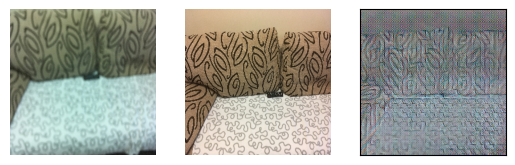

1/1 [==============================] - 0s 16ms/step
Epochs : 52 : DIS_COST  -212.75750631425115(DL) | 2.314695221999729(W_R) , -428.9039268211082(W_F) , 0.6136013476936906(B_C_R) , 0.4606185241981789(B_C_F)
Epochs : 52 : GEN_COST  2829.9826551649307(TL) | 56.54696595933702(P) , 83.4913462638855(W) , 0.6264572615976687(B_C) , 0.5267039744942277(L1)
1/1 [==============================] - 0s 16ms/step


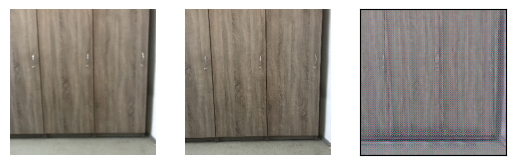

1/1 [==============================] - 0s 13ms/step
Epochs : 53 : DIS_COST  -218.6792615711689(DL) | 2.647805412168856(W_R) , -441.0823160807292(W_F) , 0.6153798412393641(B_C_R) , 0.46060774900295115(B_C_F)
Epochs : 53 : GEN_COST  2813.2476318359377(TL) | 56.21211624145508(P) , 78.97516295115153(W) , 0.6394644944756119(B_C) , 0.5282017328121044(L1)
1/1 [==============================] - 0s 15ms/step


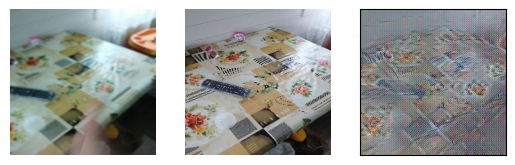

1/1 [==============================] - 0s 15ms/step
Epochs : 54 : DIS_COST  -225.38330298264822(DL) | 2.364258425903541(W_R) , -454.20097904911745(W_F) , 0.6126003336023401(B_C_R) , 0.45751368977405404(B_C_F)
Epochs : 54 : GEN_COST  2753.358707682292(TL) | 55.014383965951424(P) , 88.64614401923285(W) , 0.6429508456477413(B_C) , 0.5277215860508107(L1)
1/1 [==============================] - 0s 14ms/step


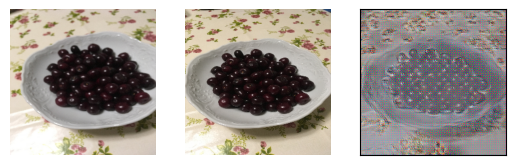

1/1 [==============================] - 0s 13ms/step
Epochs : 55 : DIS_COST  -231.663817650742(DL) | 2.8331880176784816(W_R) , -467.2277088306568(W_F) , 0.6108550226246869(B_C_R) , 0.45603110017599885(B_C_F)
Epochs : 55 : GEN_COST  2717.6449300130207(TL) | 54.30036314505118(P) , 49.085360516442194(W) , 0.5500162208521807(B_C) , 0.5252568765922829(L1)
1/1 [==============================] - 0s 14ms/step


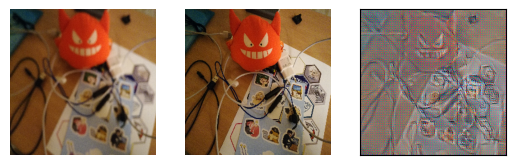

1/1 [==============================] - 0s 12ms/step
Epochs : 56 : DIS_COST  -238.1260157669032(DL) | 2.6408503927566387(W_R) , -479.95525625723377(W_F) , 0.6089918538376137(B_C_R) , 0.45338325566715665(B_C_F)
Epochs : 56 : GEN_COST  2631.5214129412616(TL) | 52.57785213611744(P) , 69.56845755400481(W) , 0.5578540607734963(B_C) , 0.5256217495158867(L1)
1/1 [==============================] - 0s 13ms/step


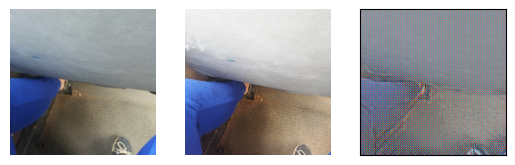

1/1 [==============================] - 0s 14ms/step
Epochs : 57 : DIS_COST  -244.8726672788461(DL) | 2.612538370710832(W_R) , -493.41992956090854(W_F) , 0.6088072971061423(B_C_R) , 0.4532484089886701(B_C_F)
Epochs : 57 : GEN_COST  2617.738855432581(TL) | 52.302130918149594(P) , 42.72618685828315(W) , 0.5144928450937625(B_C) , 0.5263772432450895(L1)
1/1 [==============================] - 0s 14ms/step


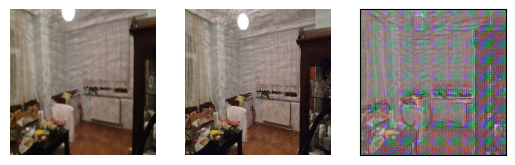

1/1 [==============================] - 0s 12ms/step
Epochs : 58 : DIS_COST  -251.4525753767402(DL) | 2.58678324724789(W_R) , -506.548358380353(W_F) , 0.6042743779994824(B_C_R) , 0.4521489061691143(B_C_F)
Epochs : 58 : GEN_COST  2583.5947505244503(TL) | 51.619531391285086(P) , 48.82796081613611(W) , 0.5270839364440353(B_C) , 0.5235351714822981(L1)
1/1 [==============================] - 0s 13ms/step


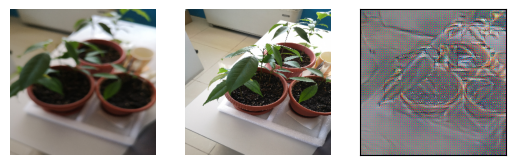

1/1 [==============================] - 0s 47ms/step


: 

In [38]:
learning_rate = 0.0001
e=100
train(t,d,epochs = e)

In [ ]:
learning_rate = 0.00005
e=100
train(t,d,epochs = e)

In [ ]:
learning_rate = 0.00004
e=100
train(t,d,epochs = e)

In [ ]:
learning_rate = 0.000032
e=100
train(t,d,epochs = e)

In [ ]:
plot_cost_curve()

# Saving Model Weights

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(t)
#converter.post_training_quantize=True
tflite_model = converter.convert()
tflite_model_name = "My_model_lite.tflite"
open(tflite_model_name, "wb").write(tflite_model)

NameError: name 'tf' is not defined

In [ ]:
for batch in image_data_test:
        batch = list(batch)
        batch[0] = (batch[0]-127.5)/127.5
        batch[1] = (batch[1]-127.5)/127.5
        batch[0][np.where(batch[0] > 1)]= 1
        batch[0][np.where(batch[0] < -1)]=-1
        batch[1][np.where(batch[1] > 1)]= 1
        batch[1][np.where(batch[1] < -1)]=-1
        input_data = batch[0][0].reshape(1,256,256,3)
        break
plt.imshow((input_data[0]+1)/2)
plt.show()

In [ ]:
interpreter = tf.lite.Interpreter(model_path="/home/ahaanbanerjee/PJT/My_model_lite.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
input_shape = input_details[0]['shape']
input_data = batch[0][0].reshape(1,256,256,3)

interpreter.set_tensor(input_details[0]['index'], input_data)
interpreter.invoke()
output_data = interpreter.get_tensor(output_details[0]['index'])
output_data = (output_data+1)/2
plt.imshow(output_data[0])
plt.show()

In [ ]:
output_data = t.predict(batch[0])
output_data = (output_data+1)/2
plt.imshow(output_data[0])
plt.show()

In [ ]:
#save_model(t,"My_model_tran.h5")
#save_model(d,"My_model_dis.h5")
#save_model(dl_m,"My_model_d_l.h5")
#save_model(tl_m"My_model_t_l.h5")
#t = load_model('My_model_tran.h5')

#  Testing

In [ ]:
def peek_signal2noise_ratio(orig_img,convrtd_img):
    MSE = (np.mean((orig_img-convrtd_img)**2))/(255*255)
    PSNR = 10*math.log10(1/MSE)
    return PSNR

In [ ]:
tt = t#load_model('My_model_tran.h5')
#dd = load_model("My_model_dis.h5")
#mm = load_model("My_model_m.h5")
#tt.summary()

In [ ]:
for batch in image_data:
    batch = list(batch)
    batch[0] = (batch[0]-127.5)/127.5
    batch[1] = (batch[1]-127.5)/127.5
    batch[0][np.where(batch[0] > 1)]= 1
    batch[0][np.where(batch[0] < -1)]=-1
    batch[1][np.where(batch[1] > 1)]= 1
    batch[1][np.where(batch[1] < -1)]=-1
    tst_img = tt.predict(batch[0])
    tst_img_b = batch[0]
    tst_img_bn = batch[1]
    break

In [ ]:
a = random.randint(0,batch[0].shape[0]-1)
img = tst_img[a:a+1,:,:,:]
img_b = tst_img_b[a:a+1,:,:,:]
img_bn = tst_img_bn[a:a+1,:,:,:]
img = (img+1)/2.0
img_b = (img_b+1)/2.0
img_bn = (img_bn+1)/2.0

In [ ]:
plt.imshow(img_b[0])
plt.title('BLURRY')
plt.show()

In [ ]:
plt.imshow(img[0])
plt.title('TRANSLATED')
plt.show()

In [ ]:
plt.imshow(img_bn[0])
plt.title('GROUND TRUTH')
plt.show()

In [ ]:
print('PSNR(S-B) : '+str(peek_signal2noise_ratio(img_bn[0],img_b[0])))
print('PSNR(B-T) : '+str(peek_signal2noise_ratio(img_b[0],img[0])))
print('PSNR(S-T) : '+str(peek_signal2noise_ratio(img_bn[0],img[0])))
print('PSNR(S-T) : '+str(cv2.PSNR(img_bn[0],img[0])))
print('PSNR(S-T) : '+str(tf.image.psnr(tf.convert_to_tensor(img_bn),tf.convert_to_tensor(img),max_val=255).numpy()[0]))
print('SSIM(S-T) : '+str(tf.image.ssim(tf.convert_to_tensor(img_bn),tf.convert_to_tensor(img),max_val=255).numpy()[0]))